<a href="https://colab.research.google.com/github/Kamyar-V2/RDW/blob/main/RDW_unsupervised_explainable_analysis_SmBFO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Reward driven workflows for unsupervised explainable analysis of phases and ferroic variants from atomically resolved imaging data**

Optimized unsupervised ML methods reveal local structural details in imaging data.
Reward-driven workflows align analysis with material's physical behavior.
VAEs disentangle structural variations, guided by measurable rewards.
* Multi-Objective Bayesian Optimization
* Hyperparameter tunning

Notebook prepared by **Kamyar Barakati**
November, 2024
Supervised by **Sergei. V Kalinin**

Nural network developed by Maxim Ziatdinov in pyroVED Python library

This notebook explores the application of multiple variations of variational autoencoders (VAEs) on cross-sectional atomic resolution scanning transmission electron microscopy (STEM) images of Sm-doped BiFeO₃ (BFO) across different nominal Sm concentrations.

The dataset consists of high-resolution electron microscopy images capturing the structural and ferroelectric properties of BiFeO₃ doped with Sm. These samples were fabricated as a combinatorial library by Prof. Ichiro Takeuchi's group at the University of Maryland, while the STEM imaging and initial physics-based analysis were conducted by Dr. Chris Nelson at Oak Ridge National Laboratory.

# Download dataset and import libraries

In [ ]:
# ! pip install wget
# ! pip install plotly
# ! pip install platypus-opt
# ! pip install opencv-python
# ! pip install -q --upgrade git+https://github.com/pycroscopy/atomai

In [ ]:
import torch
import random
tt = torch.tensor
# Setting seeds to reproduce the results
torch.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic=True
np.random.seed(0)
random.seed(0)

In [ ]:
# Importing standard Modules
import os
import csv
import numpy as np
import cv2
import h5py
import wget
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.patches as pch
import seaborn as sns
from sklearn import decomposition
from scipy import signal
import matplotlib.patches as patches
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from skimage import feature
import skimage
save_results = False
import matplotlib.colors as mcolors
from platypus import NSGAII, Problem, Real
from atomai import utils
from atomai import stat as atomstat
import atomai as aoi
import pyroved as pv
import seaborn as sns
import matplotlib.patches as patches
import plotly.graph_objs as go
from sklearn.linear_model import LinearRegression

In [ ]:
from skimage.draw import disk, rectangle
from skimage.transform import hough_line, hough_line_peaks
from skimage.transform import probabilistic_hough_line
from skimage.feature import canny
from skimage import img_as_ubyte
from sklearn.preprocessing import StandardScaler
from scipy.spatial import cKDTree
import json
from skimage.io import imsave
from sklearn.neighbors import KernelDensity
from scipy.signal import find_peaks
from scipy.ndimage import zoom

In [ ]:
# model_files = ['Sm_0_0_HAADF.h5','Sm_0_1_HAADF.h5','Sm_0_2_HAADF.h5',
#                'Sm_0_0_UCParameterization.h5','Sm_0_1_UCParameterization.h5','Sm_0_2_UCParameterization.h5',
#                'Sm_7_0_HAADF.h5','Sm_7_1_HAADF.h5', 'Sm_7_2_HAADF.h5', 'Sm_7_3_HAADF.h5', 'Sm_7_4_HAADF.h5',
#                'Sm_7_0_UCParameterization.h5','Sm_7_1_UCParameterization.h5','Sm_7_2_UCParameterization.h5','Sm_7_3_UCParameterization.h5','Sm_7_4_UCParameterization.h5',
#                'SM_10_0_HAADF.h5','Sm_10_1_HAADF.h5',
#                'Sm_10_0_UCParameterization.h5','Sm_10_1_UCParameterization.h5',
#                'Sm_13_0_HAADF.h5','Sm_13_1_HAADF.h5',
#                'Sm_13_0_UCParameterization.h5','Sm_13_1_UCParameterization.h5',
#                'Sm_20_0_HAADF.h5','Sm_20_1_HAADF.h5',
#                'Sm_20_0_UCParameterization.h5','Sm_20_1_UCParameterization.h5']

# for model_file in model_files:
#   print(model_file)
#   wget.download("https://zenodo.org/record/4555979/files/"+model_file+"?download=1", out=model_file)

In [ ]:
#list files
filedir = '/nfs/home/kbarakat/Filtered_New_Rewards'
[f for f in os.listdir(filedir)]

In [ ]:
#image files
composition_tags = [0,0,0,7,7,7,7,7,10,10,13,13,20,20]    #Sm composition %


img_filename = ['Sm_0_0_HAADF.h5','Sm_0_1_HAADF.h5','Sm_0_2_HAADF.h5',
                'Sm_7_0_HAADF.h5','Sm_7_1_HAADF.h5', 'Sm_7_2_HAADF.h5', 'Sm_7_3_HAADF.h5', 'Sm_7_4_HAADF.h5',
                'SM_10_0_HAADF.h5','Sm_10_1_HAADF.h5',
                'Sm_13_0_HAADF.h5','Sm_13_1_HAADF.h5',
                'Sm_20_0_HAADF.h5','Sm_20_1_HAADF.h5']

imnum = len(img_filename)

#paramterization files

UCparam_filename = ['Sm_0_0_UCParameterization.h5','Sm_0_1_UCParameterization.h5','Sm_0_2_UCParameterization.h5',
                    'Sm_7_0_UCParameterization.h5','Sm_7_1_UCParameterization.h5','Sm_7_2_UCParameterization.h5','Sm_7_3_UCParameterization.h5','Sm_7_4_UCParameterization.h5',
                    'Sm_10_0_UCParameterization.h5','Sm_10_1_UCParameterization.h5',
                    'Sm_13_0_UCParameterization.h5','Sm_13_1_UCParameterization.h5',
                    'Sm_20_0_UCParameterization.h5','Sm_20_1_UCParameterization.h5']

#load parameter files
UCparam = []
for x in UCparam_filename:
  print('loading parameterization file: ', os.path.join(filedir, x))
  temp = h5py.File(os.path.join(filedir, x), 'r')
  UCparam.append(temp)

#load images
imgdata = []
for x in img_filename:
  print('loading image file: ', os.path.join(filedir, x))
  temp = h5py.File(os.path.join(filedir, x), 'r')['MainImage']
  imgdata.append(temp)

print('UC parameterization:', [k for k in UCparam[0].keys()])

## Data preparation

* Ground Truth

In [ ]:
#function maps x,y grid positions into a matrix data format
def map2grid(inab, inVal):

  default_val = np.nan
  abrng = [int(np.min(inab[:,0])), int(np.max(inab[:,0])), int(np.min(inab[:,1])), int(np.max(inab[:,1]))]
  abind = inab
  abind[:,0] -= abrng[0]
  abind[:,1] -= abrng[2]
  Valgrid = np.empty((abrng[1]-abrng[0]+1,abrng[3]-abrng[2]+1))
  Valgrid[:] = default_val
  Valgrid[abind[:,0].astype(int),abind[:,1].astype(int)]=inVal[:]
  return Valgrid, abrng

In [ ]:
SBFOdata = []     #this will be the output list of dictionaries for each dataset

for i in np.arange(imnum):
  temp_dict = {'Index': i}
  temp_dict['Composition'] = composition_tags[i]
  temp_dict['Image'] = imgdata[i]
  temp_dict['Filename'] = img_filename[i]

  for k in UCparam[i].keys():       #add labels for UC parameterization
    temp_dict[k] = UCparam[i][k][()]

  #select values mapped to ab grid
  temp_dict['ab_a'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,0])[0]       #a array
  temp_dict['ab_b'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,1])[0]       #b array
  temp_dict['ab_x'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,0])[0]   #x array
  temp_dict['ab_y'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,1])[0]   #y array
  temp_dict['ab_Px'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][0])[0]             #Px array
  temp_dict['ab_Py'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][1])[0]        #Py array
  temp_dict['Vol'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Vol'])[0]     #Vol array

  SBFOdata.append(temp_dict)

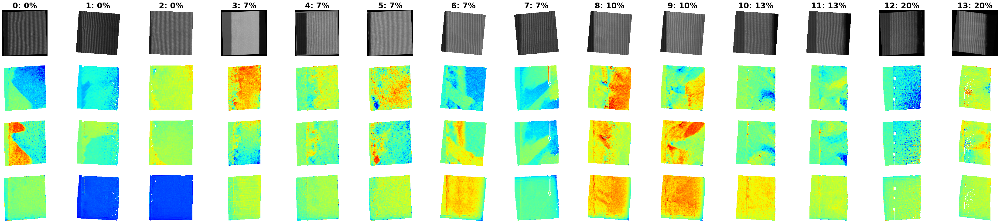

In [ ]:
fig, ax = plt.subplots(nrows=4, ncols=len(SBFOdata), figsize=(4*len(SBFOdata), 4*3), dpi=100)
for i, k in enumerate(SBFOdata):
  #Image
  ax[0,i].imshow(k['Image'], origin='upper', cmap='gray')
  ax[0,i].set_title(str(k['Index'])+': '+str(k['Composition'])+'%', fontsize = 24, fontweight = "bold")
  ax[0,i].set_axis_off()
  #Px
  ax[1,i].imshow(k['ab_Px'], origin='upper', cmap='jet')
  ax[1,i].set_axis_off()
  #Py
  ax[2,i].imshow(k['ab_Py'], origin='upper', cmap='jet')
  ax[2,i].set_axis_off()

  # Vol (added row to display Vol)
  ax[3, i].imshow(k['Vol'], origin='upper', cmap='jet')
  ax[3, i].set_axis_off()

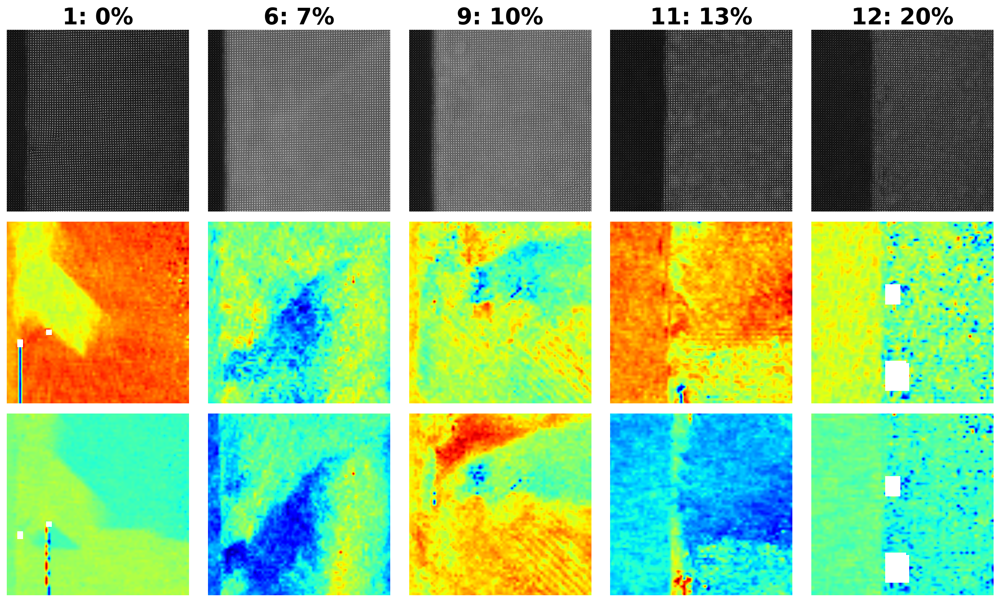

In [ ]:
from scipy.ndimage import zoom
from matplotlib.patches import Rectangle

# Define the main area to be highlighted with a red square
main = [1000, 3000, 400, 2400]  # [y_start, y_end, x_start, x_end]

# Example: Resizing ab_Px and ab_Py, and plotting the selected region
for i in [1, 6, 9, 11, 12]:
    img_shape = SBFOdata[i]["Image"].shape  # Target shape
    px_shape = SBFOdata[i]["ab_Px"].shape  # Current shape of ab_Px
    py_shape = SBFOdata[i]["ab_Py"].shape  # Current shape of ab_Py

    # Calculate the zoom factor for resizing ab_Px and ab_Py
    zoom_factors_px = [img_shape[0] / px_shape[0], img_shape[1] / px_shape[1]]
    zoom_factors_py = [img_shape[0] / py_shape[0], img_shape[1] / py_shape[1]]

    # Resize ab_Px and ab_Py to match the Image shape and ensure they are exactly the same size
    SBFOdata[i]["ab_Px_resized"] = zoom(SBFOdata[i]["ab_Px"], zoom_factors_px, order=1)
    SBFOdata[i]["ab_Py_resized"] = zoom(SBFOdata[i]["ab_Py"], zoom_factors_py, order=1)

    # Ensure the resized arrays match the image shape exactly (if rounding issues occur)
    SBFOdata[i]["ab_Px_resized"] = SBFOdata[i]["ab_Px_resized"][:img_shape[0], :img_shape[1]]
    SBFOdata[i]["ab_Py_resized"] = SBFOdata[i]["ab_Py_resized"][:img_shape[0], :img_shape[1]]

# Create figure with subplots for the selected data points
fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(3*5, 3*3), dpi=200)

for j, idx in enumerate([1, 6, 9, 11, 12]):
    k = SBFOdata[idx]

    # Image - select the region
    selected_image = k['Image'][main[0]:main[1], main[2]:main[3]]
    ax[0, j].imshow(selected_image, origin='upper', cmap='gray')
    ax[0, j].set_title(f"{k['Index']}: {k['Composition']}%", fontsize=24, fontweight="bold")
    ax[0, j].set_axis_off()
    ax[0, j].invert_yaxis()

    # Px - select the region
    selected_px = k['ab_Px_resized'][main[0]:main[1], main[2]:main[3]]
    ax[1, j].imshow(selected_px, origin='upper', cmap='jet')
    ax[1, j].set_axis_off()
    ax[1, j].invert_yaxis()

    # Py - select the region
    selected_py = k['ab_Py_resized'][main[0]:main[1], main[2]:main[3]]
    ax[2, j].imshow(selected_py, origin='upper', cmap='jet')
    ax[2, j].set_axis_off()
    ax[2, j].invert_yaxis()

plt.tight_layout()
plt.show()

In [ ]:
# Let's create new lists to store the selected images, Px, and Py data
selected_images = []
ground_truth_px = []
ground_truth_py = []

# Define the main area to be highlighted
main = [1000, 3000, 400, 2400]  # [y_start, y_end, x_start, x_end]

# Loop over the selected indices, extract the region, and store it
for i in [1, 6, 9, 11, 12]:
    k = SBFOdata[i]

    # Select the region from the image, Px, and Py
    selected_image = k['Image'][main[0]:main[1], main[2]:main[3]]
    selected_px = k['ab_Px_resized'][main[0]:main[1], main[2]:main[3]]
    selected_py = k['ab_Py_resized'][main[0]:main[1], main[2]:main[3]]

    # Append the selected regions to the corresponding lists
    selected_images.append(selected_image)
    ground_truth_px.append(selected_px)
    ground_truth_py.append(selected_py)

# The selected images, ground truth Px, and ground truth Py have been stored in the lists:
# selected_images, ground_truth_px, and ground_truth_py
# I will now display a confirmation of the stored data.
len(selected_images), len(ground_truth_px), len(ground_truth_py)


(5, 5, 5)

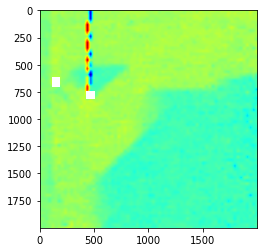

In [ ]:
plt.imshow(ground_truth_py[0], cmap = "jet")

# Clustering Optimization
* GMM

## Define clustering functions and Descriptor

In [ ]:
# min-max normalization:
def norm2d(img: np.ndarray) -> np.ndarray:
    return (img - np.min(img)) / (np.max(img) - np.min(img))

In [ ]:
def custom_extract_subimages(imgdata, coordinates, w_prime):
    # Stage 1: Extract subimages with a fixed size (64x64)
    large_window_size = (64, 64)
    half_height_large = large_window_size[0] // 2
    half_width_large = large_window_size[1] // 2
    subimages_largest = []
    coms_largest = []

    for coord in coordinates:
        cx = int(np.around(coord[0]))
        cy = int(np.around(coord[1]))
        top = max(cx - half_height_large, 0)
        bottom = min(cx + half_height_large, imgdata.shape[0])
        left = max(cy - half_width_large, 0)
        right = min(cy + half_width_large, imgdata.shape[1])

        subimage = imgdata[top:bottom, left:right]
        if subimage.shape[0] == large_window_size[0] and subimage.shape[1] == large_window_size[1]:
            subimages_largest.append(subimage)
            coms_largest.append(coord)

    # Stage 2: Use these centers to extract subimages of window size `w1`
    half_height = w_prime[0] // 2
    half_width = w_prime[1] // 2
    subimages_target = []
    coms_target = []

    for coord in coms_largest:
        cx = int(np.around(coord[0]))
        cy = int(np.around(coord[1]))
        top = max(cx - half_height, 0)
        bottom = min(cx + half_height, imgdata.shape[0])
        left = max(cy - half_width, 0)
        right = min(cy + half_width, imgdata.shape[1])

        subimage = imgdata[top:bottom, left:right]
        if subimage.shape[0] == w_prime[0] and subimage.shape[1] == w_prime[1]:
            subimages_target.append(subimage)
            coms_target.append(coord)

    return np.array(subimages_target), np.array(coms_target)

In [ ]:
def build_descriptor(window_size, min_sigma, max_sigma, threshold, overlap):

    processed_img = img

    all_atoms = skimage.feature.blob_log(processed_img, min_sigma, max_sigma, 30, threshold, overlap)
    coordinates = all_atoms[:, : -1]
    # Extract subimages
    subimages_target, coms_target = custom_extract_subimages(processed_img, coordinates, window_size)
    # Build descriptors
    descriptors = [subimage.flatten() for subimage in subimages_target]
    descriptors = np.array(descriptors)

    return descriptors, coms_target, all_atoms, coordinates, subimages_target

In [ ]:
def gmm_pca_clustering(descriptors, n_clusters, n_components=2, **kwargs):

    # Flatten each subimage into a 1D vector
    flattened_descriptors = descriptors.reshape(descriptors.shape[0], -1)

    # Remove subimages with NaN values
    mask = ~np.isnan(flattened_descriptors).any(axis=1)
    valid_subimages = flattened_descriptors[mask]

    # Apply PCA for dimensionality reduction
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(valid_subimages)

    # Initialize and fit the Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, **kwargs)
    labels = gmm.fit_predict(reduced_data)

    # Map the labels back to the original data, including NaN-handling
    full_labels = np.full(descriptors.shape[0], -1)
    full_labels[mask] = labels

    # Extract GMM centroids and covariances in the PCA-reduced space
    centroids = gmm.means_
    covariances = gmm.covariances_

    scaler = StandardScaler()
    centroids_pca = scaler.fit_transform(centroids)
    covariances_pca = covariances / np.max(covariances)

    return full_labels, reduced_data, centroids_pca, covariances_pca

In [ ]:
def gmm_clustering(descriptors, n_clusters, **kwargs):

    # Flatten each subimage into a 1D vector
    flattened_descriptors = descriptors.reshape(descriptors.shape[0], -1)

    # Remove subimages with NaN values
    mask = ~np.isnan(flattened_descriptors).any(axis=1)
    valid_subimages = flattened_descriptors[mask]

    # scaler = StandardScaler()
    # valid_subimages = scaler.fit_transform(valid_subimages)
    # Initialize the Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, **kwargs)

    # Fit the model to the valid subimages and predict the labels
    labels = gmm.fit_predict(valid_subimages)

    # Create a full set of labels, assigning -1 to removed subimages
    full_labels = np.full(descriptors.shape[0], -1)
    full_labels[mask] = labels

    # Extract the GMM centroids (means) and covariances
    centroids = gmm.means_
    covariances = gmm.covariances_

    scaler = StandardScaler()
    centroids = scaler.fit_transform(centroids)
    covariances = covariances / np.max(covariances)

    return labels, valid_subimages, centroids, covariances

In [ ]:
# Define the Fit_GMM_param function without PCA, including covariance type
def Fit_GMM_param(descriptors, components, covariance_type):
    # First pass of GMM to estimate initial parameters
    preliminary_gmm = GaussianMixture(n_components=components, covariance_type=covariance_type, random_state=42)
    preliminary_gmm.fit(descriptors)
    initial_means = preliminary_gmm.means_
    initial_weights = preliminary_gmm.weights_

    # Initialize and fit the GMM using the parameters from the preliminary GMM
    gmm = GaussianMixture(n_components=components,
                          means_init=initial_means,
                          weights_init=initial_weights,
                          covariance_type=covariance_type,
                          random_state=42)
    gmm.fit(descriptors)
    labels = gmm.predict(descriptors)

    return labels

### Define image

Testing

In [ ]:
image = selected_images[0]
img = norm2d(image)

In [ ]:
w_prime = (46,58)
min_sigma = 1
max_sigma = 5
threshold = 0.04
overlap = 0.0
descriptors, coms_target, all_atoms, coordinates, subimages_target = build_descriptor(w_prime, min_sigma, max_sigma, threshold, overlap)

In [ ]:
print(descriptors.shape)
print(coms_target.shape)
print(all_atoms.shape)
print(coordinates.shape)
print(subimages_target.shape)

(10860, 2668)
(10860, 2)
(11715, 3)
(11715, 2)
(10860, 46, 58)


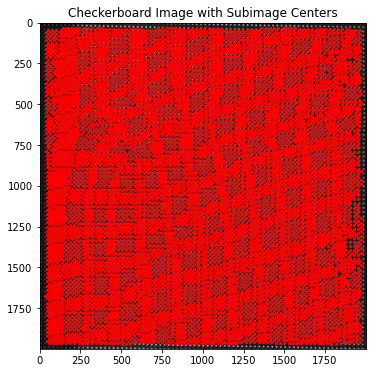

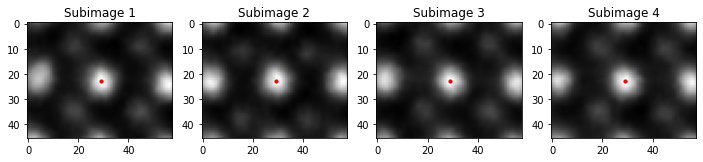

In [ ]:
plt.figure(figsize=(6, 6))
plt.imshow(image, cmap='gray')
plt.scatter(coms_target[:, 1], coms_target[:, 0], c='r', marker='o', s = 5
            )
plt.title('Checkerboard Image with Subimage Centers')
plt.show()

# Plot a few example subimages with their centers
fig, axes = plt.subplots(1, 4, figsize=(12, 3))
for i, ax in enumerate(axes):
    ax.imshow(subimages_target[i], cmap='gray')
    ax.scatter(w_prime[1] // 2, w_prime[0] // 2, c='r', marker='o', s = 10)
    ax.set_title(f'Subimage {i+1}')
plt.show()

In [ ]:
labels, valid_subimages, centroids, covariances = gmm_clustering(descriptors, 5, covariance_type = "full")

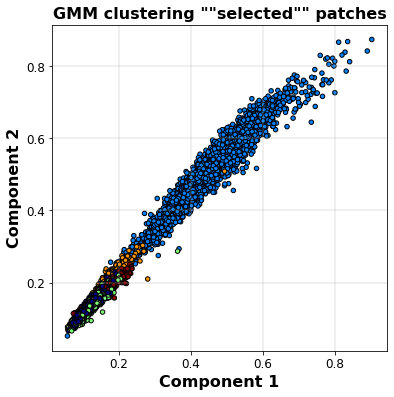

In [ ]:
labels  = Fit_GMM_param(descriptors, 5, "full")

# Visualization in the PCA reduced space (if PCA is used)
plt.figure(figsize=(6, 6))
plt.scatter(descriptors[:, 0], descriptors[:, 1], c=labels, s=20, cmap='jet', edgecolor='k')
plt.title('GMM clustering ""selected"" patches' , fontsize = 16, fontweight = "bold")
plt.xlabel('Component 1' , fontsize = 16, fontweight = "bold")
plt.ylabel('Component 2' , fontsize = 16, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=12)
plt.grid(True, linewidth=0.4)
plt.show()

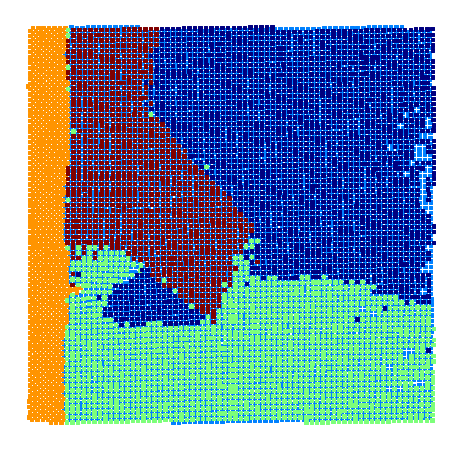

In [ ]:
plt.figure(figsize=(8,8))

plt.scatter(coms_target[:, 1], coms_target[:, 0], c=labels,  s=12, cmap='jet', marker= "s")
plt.axis('off')
plt.show()

## OPTIMIZATION

In [ ]:
def run_1(window_size, covariance_type, components):

            min_sigma = 1
            max_sigma = 5
            threshold = 0.03
            overlap = 0.0
            w_prime = window_size
            descriptors, coms_target, all_atoms, coordinates, subimages_target = build_descriptor(w_prime, min_sigma, max_sigma, threshold, overlap)

            labels = Fit_GMM_param(descriptors, components, covariance_type)

            return labels, coms_target, descriptors

Define a function to handle clusters boundaries

In [ ]:
def process_labels_and_plot(labels, coms_target):

    colors = list(mcolors.TABLEAU_COLORS.keys())
    image = selected_images[0]
    sigma = 15
    point_size = 25
    point_shape = 'circle'

    edges_per_label = []  # To store edges for each unique label

    # Loop through each unique label
    for unique_label in np.unique(labels):
        # Create a mask image to visualize the clusters directly
        mask_image = np.zeros(image.shape, dtype=np.uint8)

        # Assign values to different clusters with circular or rectangular point size
        for coord, label in zip(coms_target, labels):
            y, x = int(coord[0]), int(coord[1])  # Ensure coms_target coordinates are correctly mapped
            if 0 <= x < mask_image.shape[1] and 0 <= y < mask_image.shape[0]:
                if label == unique_label:
                    if point_shape == 'circle':
                        rr, cc = disk((y, x), point_size, shape=mask_image.shape)
                        mask_image[rr, cc] = 255  # White for the selected cluster
                    elif point_shape == 'square':
                        start = (max(0, y - point_size // 2), max(0, x - point_size // 2))
                        extent = (min(point_size, mask_image.shape[0] - start[0]), min(point_size, mask_image.shape[1] - start[1]))
                        rr, cc = rectangle(start, extent=extent, shape=mask_image.shape)
                        mask_image[rr, cc] = 255  # White for the selected cluster

        # Apply Canny filter to find boundaries of each label
        edges = canny(mask_image, sigma=sigma)

        # Crop edges to remove points close to the border (10% on each side)
        height, width = edges.shape
        y_margin = int(height * 0.05)
        x_margin = int(width * 0.05)
        edges_cropped = edges[y_margin:height - y_margin, x_margin:width - x_margin]

        # Store the cropped edges per label
        edges_per_label.append((unique_label, edges_cropped))

    # Display the edges
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(image, cmap=plt.cm.gray)

    # Overlay cropped edges for each label with different colors
    for idx, (label, edges_cropped) in enumerate(edges_per_label):
        color = colors[idx % len(colors)]
        # Set extent to display cropped edges correctly within the image
        ax.imshow(edges_cropped, cmap=plt.cm.gray, alpha=0.7, extent=(x_margin, width - x_margin, height - y_margin, y_margin))

    ax.tick_params(axis="both", which="both", bottom=False, left=False, right=False, top=False, labelbottom=False, labelleft=False)
    ax.invert_yaxis()
    plt.show()

    return edges_per_label

In [ ]:
# edges_per_label = process_labels_and_plot(labels, coms_target)

Define a fucntion to handle canny edge detected lines

In [ ]:
def filter_ordered_segments(edges):
    # Dictionary to store edge coordinates for each label
    data = {}
    for label, edge_mask in edges:
        # Get edge coordinates where mask is True
        edges = np.argwhere(edge_mask)
        data[label] = edges

    distance_threshold = 30

    def order_points_nearest_neighbor(points):

        if len(points) == 0:
            return np.array([])  # Return empty array if no points

        points = np.array(points)
        ordered_points = [points[0]]
        remaining_points = points[1:]
        tree = cKDTree(remaining_points)

        while len(remaining_points) > 0:
            last_point = ordered_points[-1]
            dist, idx = tree.query(last_point, k=1)
            ordered_points.append(remaining_points[idx])
            remaining_points = np.delete(remaining_points, idx, axis=0)
            tree = cKDTree(remaining_points)

        return np.array(ordered_points)

    # Dictionary to store filtered segments for each label
    filtered_segments = {}

    for label, edge_coordinates in data.items():
        # Skip empty edge coordinates
        if len(edge_coordinates) == 0:
            filtered_segments[label] = []
            continue

        # Order the points based on the nearest neighbor approach
        ordered_points = order_points_nearest_neighbor(edge_coordinates)
        segments = []

        # Calculate distances and segment lines based on the distance threshold
        distances = np.linalg.norm(np.diff(ordered_points, axis=0), axis=1)
        current_segment = [ordered_points[0]]

        for i in range(len(distances)):
            if distances[i] <= distance_threshold:
                current_segment.append(ordered_points[i + 1])
            else:
                segments.append(np.array(current_segment))
                current_segment = [ordered_points[i + 1]]

        if current_segment:
            segments.append(np.array(current_segment))

        filtered_segments[label] = segments

    return filtered_segments

In [ ]:
# # Example usage with sample data
# filtered_segments_3 = filter_ordered_segments(edges_per_label)
# print("Filtered and Ordered Segments:", filtered_segments_3)

Testing

In [ ]:
def plot_filtered_segments(filtered_segments):

    num_labels = len(filtered_segments)
    fig, axes = plt.subplots(1, num_labels, figsize=(5 * num_labels, 5))

    if num_labels == 1:
        axes = [axes]  # Make axes iterable if there is only one subplot

    colors = ['r', 'g', 'b', 'y', 'c', 'm', 'k']  # Different colors for segments

    for idx, (label, segments) in enumerate(filtered_segments.items()):
        ax = axes[idx]
        ax.set_title(f"Label {label}")
        ax.set_xticks([])
        ax.set_yticks([])

        for i, segment in enumerate(segments):
            color = colors[i % len(colors)]  # Cycle through colors
            ax.plot(segment[:, 1], segment[:, 0], marker="o", color=color, linewidth=5)

    plt.suptitle("Filtered and Ordered Segments for Each Label")
    plt.tight_layout()
    plt.show()

In [ ]:
# # Call the function to plot
# plot_filtered_segments(filtered_segments_3)

### Reward Definition



**Reward_1**:

**Straigthness**

In [ ]:
def compute_curvature(x, y, ordered=True):

    if not ordered:
        # Sort the points by the closest neighboring ordering
        x, y = closest_neighbor_sort(x, y)

    dx = np.gradient(x)
    dy = np.gradient(y)
    d2x = np.gradient(dx)
    d2y = np.gradient(dy)
    # Compute curvature at each point using the finite difference approximations
    curvature = np.abs(dx * d2y - dy * d2x) / (dx**2 + dy**2)**1.5
    curvature = np.nan_to_num(curvature)  # Replace NaNs with zero (for flat segments)

    # Calculate the average curvature
    average_curvature = np.mean(curvature)
    return average_curvature

# Function to find the closest neighbor order
def closest_neighbor_sort(x, y):

    # Stack x and y arrays to form (x, y) point coordinates
    points = np.column_stack((x, y))

    # Number of points
    num_points = len(points)

    # Start with the first point
    ordered_points = [points[0]]
    points = np.delete(points, 0, axis=0)  # Remove the starting point from the list

    # Greedy approach to find the nearest neighbor
    while len(points) > 0:
        # Compute distances from the last ordered point to all remaining points
        last_point = ordered_points[-1]
        distances = np.linalg.norm(points - last_point, axis=1)

        # Find the index of the closest point
        closest_index = np.argmin(distances)

        # Add the closest point to the ordered list and remove it from the remaining points
        ordered_points.append(points[closest_index])
        points = np.delete(points, closest_index, axis=0)

    return np.array(ordered_points)[:,0], np.array(ordered_points)[:,1]


def process_single_curvature(filtered_data):
    average_curvatures = []

    for label, segments in filtered_data.items():
        label_curvatures = []

        for segment in segments:
            if len(segment) < 3:
                continue  # Skip segments with fewer than 3 points

            x, y = segment[:, 1], segment[:, 0]
            average_curvature = compute_curvature(x, y, ordered=False)

            # Only include curvature if it is a valid value (either a real zero or non-zero)
            if average_curvature != 0 or np.any(average_curvature):
                label_curvatures.append(average_curvature)

        # If label has valid curvatures, calculate the mean and add to overall list
        if label_curvatures:
            average_curvatures.append(np.mean(label_curvatures))

    # Calculate the mean curvature for the entire data set if there are valid curvatures
    mean_curvature = np.mean(average_curvatures) if average_curvatures else None

    return mean_curvature

Testing

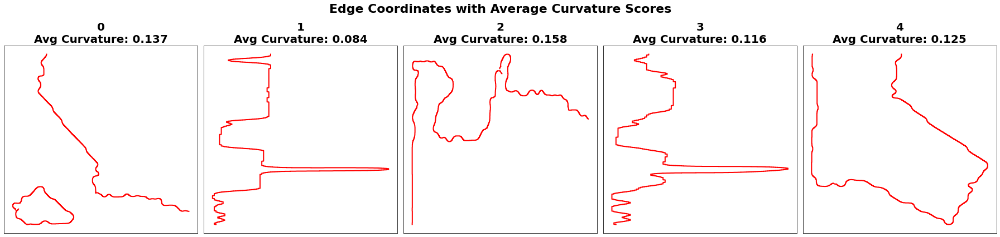

In [ ]:
# Initialize a list to store average curvatures for all segments in each label
average_curvatures_1 = []

# Set up plotting for each label
num_labels = len(filtered_segments_3)
fig, axes = plt.subplots(1, num_labels, figsize=(5 * num_labels, 6))

for idx, (label, segments) in enumerate(filtered_segments_3.items()):
    # For each label, initialize an empty list to store segment curvatures
    label_curvatures = []
    ax = axes[idx] if num_labels > 1 else axes  # Handle single subplot case

    for segment in segments:
        if len(segment) < 3:
            # Skip segments with fewer than 3 points
            continue

        x, y = segment[:, 1], segment[:, 0]  # Extract x and y coordinates

        # Compute curvature for the segment
        average_curvature = compute_curvature(x, y, ordered=False)
        label_curvatures.append(average_curvature)

        # Plot each segment
        ax.plot(x, y, color="r", linewidth=2)

    # Calculate the average curvature across all segments in the label
    if label_curvatures:
        average_curvatures_1.append(np.mean(label_curvatures))
    else:
        # If no valid segments, assign curvature of 0 (or another default value if preferred)
        average_curvatures_1.append(0)

    # Set title for each subplot
    ax.set_title(f"{label}\nAvg Curvature: {np.mean(label_curvatures):.3f}" if label_curvatures else f"{label}\nNo Curvature", fontsize=20, fontweight="bold")
    ax.set_xticks([])
    ax.set_yticks([])

plt.suptitle("Edge Coordinates with Average Curvature Scores", fontsize=22, fontweight="bold")
plt.tight_layout()
plt.show()

In [ ]:
# # Example usage with a single filtered data set
# mean_curvature_single = process_single_curvature(filtered_segments_3)
# print("Mean Curvature for Single Filtered Data:", mean_curvature_single)

Mean Curvature for Single Filtered Data: 0.12431634701172026


**Reward_2**:

**Length continuity**

In [ ]:
def calculate_segment_length(segment):
    """Calculate the total length of a single segment."""
    return np.sum(np.linalg.norm(np.diff(segment, axis=0), axis=1))

def calculate_reward_for_cluster(segments):
    """Calculate the reward for a cluster based on total length and continuity."""
    # Calculate total length of all segments in the cluster
    total_length = sum(calculate_segment_length(segment) for segment in segments)
    num_segments = len(segments) if segments else 1  # Avoid division by zero if no segments

    # Reward is the total length divided by the number of segments (to penalize segmentation)
    reward = total_length / num_segments
    return reward

def calculate_reward_for_single_data(filtered_data):
    """Calculate reward for a single configuration of filtered data."""
    cluster_rewards = []
    for label, segments in filtered_data.items():
        # Calculate reward for each cluster
        reward = calculate_reward_for_cluster(segments)
        cluster_rewards.append(reward)

    # Calculate the average reward across all clusters in this single data configuration
    reward_for_data = np.mean(cluster_rewards)

    return reward_for_data

In [ ]:
# reward_for_data = calculate_reward_for_single_data(filtered_segments_3)
# reward_for_data

1443.3854593782014

### **Optimization block**

* **2** objetives
* **3** hayperparameters

1. descriptor_hight
2. descriptor_width
3. covariance_tuype

In [ ]:
# Define your ImageOptimizationProblem class
class ImageOptimizationProblem(Problem):
    def __init__(self):
        # Define the problem with 3 decision variables (2 for w_prime and 1 for covariance type) and 2 objectives
        super(ImageOptimizationProblem, self).__init__(3, 2)

        # Define ranges for w_prime (height and width) and a continuous representation of covariance_type
        self.types[:] = [
            Real(8, 64),  # w_prime height
            Real(8, 64),  # w_prime width
            Real(0, 3)    # covariance type as a continuous variable
        ]
        self.directions[:] = [Problem.MINIMIZE, Problem.MAXIMIZE]

    def evaluate(self, solution):
        # Helper function to ensure the values are even
        def to_even_value(x):
            return int(np.round(x / 2) * 2)

        # Extract and ensure w_prime values are even
        w_prime = (to_even_value(solution.variables[0]), to_even_value(solution.variables[1]))

        # Map the continuous covariance variable to a categorical index
        covariance_index = int(solution.variables[2])
        covariance_types = ['full', 'tied', 'diag', 'spherical']
        covariance_type = covariance_types[covariance_index % len(covariance_types)]

        # Call your external function or process that computes the labels, descriptors, etc.
        # These should be based on w_prime and covariance_type
        labels, coms_target, descriptors = run_1(w_prime, covariance_type, components=5)
        edges_per_label = process_labels_and_plot(labels, coms_target)
        filtered_segments = filter_ordered_segments(edges_per_label)

        curvature = process_single_curvature(filtered_segments)
        length = calculate_reward_for_single_data(filtered_segments)

        # Set the objectives (negated for minimization)
        solution.objectives[:] = [curvature, length]  # Minimizing both rewards

In [ ]:
# Example usage of NSGAII optimization
problem = ImageOptimizationProblem()
algorithm = NSGAII(problem)
algorithm.run(1)  # Run the algorithm for 100 iterations

# Save the results to a CSV file
with open('solution_results_new.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    # Write the header
    writer.writerow(["Height_prime", "Width_prime", "Covariance Type", "Reward_1", "Reward_3"])

    # Iterate through the results and save each solution to the CSV
    for solution in algorithm.result:
        def to_even_value(x):
            return int(np.round(x / 2) * 2)

        # Ensure height and width values are even
        height_prime = to_even_value(solution.variables[0])
        width_prime = to_even_value(solution.variables[1])

        # Map the continuous covariance variable to categorical
        covariance_index = int(solution.variables[2])
        covariance_types = ['full', 'tied', 'diag', 'spherical']
        covariance_type = covariance_types[covariance_index % len(covariance_types)]

        # Save the results
        writer.writerow([height_prime, width_prime, covariance_type,
                         f"{solution.objectives[0]:.2f}", f"{solution.objectives[1]:.2f}"])

        # Optionally, print the results to the console as well
        print(f"Height_prime: {height_prime}, Width_prime: {width_prime}, Covariance Type: {covariance_type}, "
              f"Reward_1: {solution.objectives[0]:.2f}, Reward_3: {solution.objectives[1]:.2f}")

print("Results saved to 'solution_results_new.csv'.")

Results representation as pareto fronts

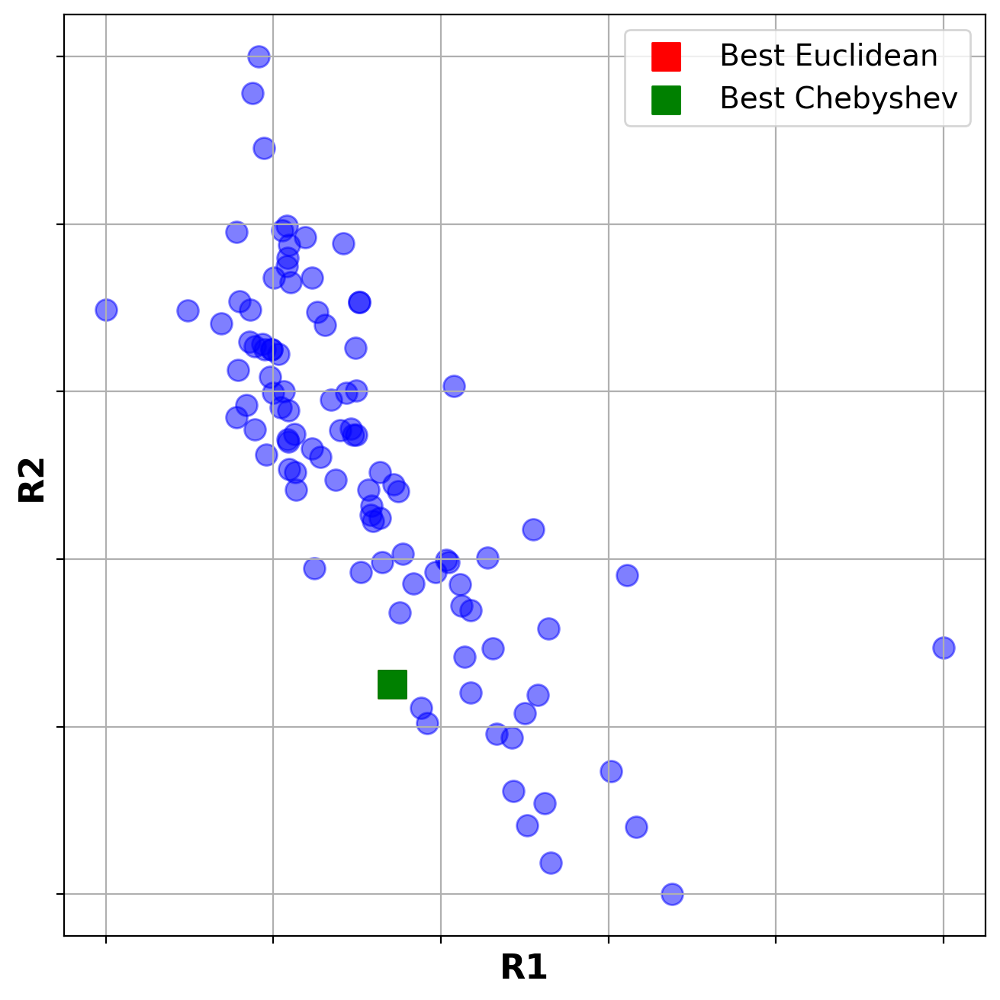

In [ ]:
# Given: solutions and objectives extraction from your algorithm's result
solutions_A = algorithm.result
objectives_A = [s.objectives[:] for s in solutions_A]

# Define your ideal point here
ideal_point = [0, 0]  # Replace ideal_obj1 and ideal_obj2 with your ideal values

# Normalize objectives between 0 and 1
obj_array = np.array(objectives_A)
obj_min = obj_array.min(axis=0)
obj_max = obj_array.max(axis=0)
normalized_objectives = (obj_array - obj_min) / (obj_max - obj_min)

# Calculate distances
euclidean_distances = [np.sqrt(np.sum((obj - ideal_point) ** 2)) for obj in normalized_objectives]
chebyshev_distances = [np.max(np.abs(obj - ideal_point)) for obj in normalized_objectives]

# Find the best solutions based on distances
best_solution_euclidean_index = np.argmin(euclidean_distances)
best_solution_chebyshev_index = np.argmin(chebyshev_distances)

# Separate normalized objectives for plotting
obj1 = normalized_objectives[:, 0]
obj2 = normalized_objectives[:, 1]


fig = plt.figure(figsize=(8, 8), dpi = 200)

# Create scatter plot of the Pareto front
plt.scatter(obj1, obj2, s=100, marker='o', c="blue", alpha=0.5)
plt.scatter(obj1[best_solution_euclidean_index], obj2[best_solution_euclidean_index], color='red', label='Best Euclidean' , alpha=1, marker='s', s = 160)
plt.scatter(obj1[best_solution_chebyshev_index], obj2[best_solution_chebyshev_index], color='green', label='Best Chebyshev', alpha=1, marker='s', s = 160)
# Create scatter plot

# Adding plot labels and title
# plt.title('Solutions Highlighted', fontsize = 16, fontweight = "bold")
plt.xlabel('R1', fontsize = 16, fontweight = "bold")
plt.ylabel('R2', fontsize = 16, fontweight = "bold")
plt.grid(True)
# plt.tick_params(axis='both', which='major', labelsize= 14)
# Keep the ticks but hide the tick labels
plt.tick_params(axis='both', which='both', labelbottom=False, labelleft=False)

# plt.xlim([-0.05, 1])  # Replace xmin and xmax with your desired values
# plt.ylim([-0.05, 1])
plt.legend(prop={'size': 14})
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

Best possible results

In [ ]:
solutions_A[best_solution_euclidean_index]

# Retrieve the best solutions based on Euclidean and Chebyshev distances
best_solution_euclidean_A = solutions_A[best_solution_euclidean_index]
best_solution_chebyshev_A = solutions_A[best_solution_chebyshev_index]

# Extract the parameters from these solutions
best_parameters_euclidean_A = best_solution_euclidean_A.variables
best_parameters_chebyshev_A = best_solution_chebyshev_A.variables

# Convert the index back to the appropriate covariance type
covariance_index_euclidean_A = int(best_parameters_euclidean_A[2])
covariance_index_chebyshev_A = int(best_parameters_chebyshev_A[2])
covariance_index_euclidean_A = covariance_types[covariance_index_euclidean_A % len(covariance_types)]
covariance_index_chebyshev_A = covariance_types[covariance_index_chebyshev_A % len(covariance_types)]

# Print the result
print(f"The covariance type euclidean is: {covariance_index_euclidean_A}")
print(f"The covariance type chebyshev is: {covariance_index_chebyshev_A}")
# Print the best parameters for each method
print("Best Parameters based on Euclidean Distance:", best_parameters_euclidean_A)
print("Best Parameters based on Chebyshev Distance:", best_parameters_chebyshev_A)

The covariance type euclidean is: full
The covariance type chebyshev is: full
Best Parameters based on Euclidean Distance: [9.510378941960752, 59.49505759764908, 0.5900653628715399]
Best Parameters based on Chebyshev Distance: [9.510378941960752, 59.49505759764908, 0.5900653628715399]


Testing

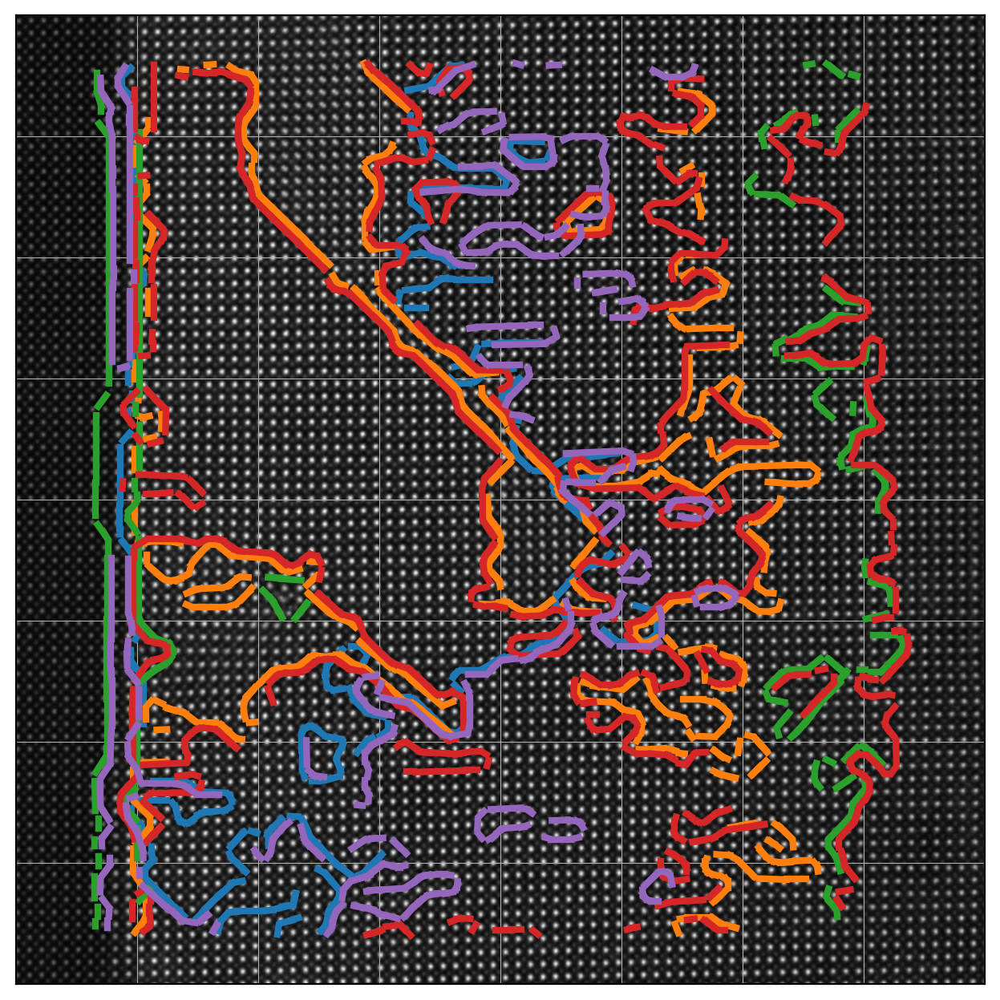

In [ ]:
# Fixed values
covariance_type = 'diag'  # Type of covariance in GMM
components = 5  # Number of components for GMM

# Test different window sizes
window_sizes = [(10,60)]  # Different window sizes

for w_size in window_sizes:
    labels, coms_target, descriptors = run_1(w_size, covariance_type, components)
    filtered_lines, lines_per_label = process_labels_and_plot(labels, coms_target, selected_labels)


# Conditional Auto Encoder

## Conditional VAE embeded rotation

condition 1: Set the conditiona as A and B site of the material

In [ ]:
w = (40,40)
min_sigma = 1
max_sigma = 5
threshold = 0.025
overlap = 0.0
descriptors_c, coms_target_c, all_atoms_c, coordinates_c, subimages_target_c = build_descriptor(w,
                                                                                                min_sigma,
                                                                                                max_sigma,
                                                                                                threshold,
                                                                                                overlap)

print(descriptors_c.shape)
print(subimages_target_c.shape)
print(coms_target_c.shape)
print(all_atoms_c.shape)
print(coordinates_c.shape)


labels_c  = Fit_GMM_param(descriptors_c, 2, "full")
print(labels_c.shape)

(10939, 1600)
(10939, 40, 40)
(10939, 2)
(11754, 3)
(11754, 2)
(10939,)


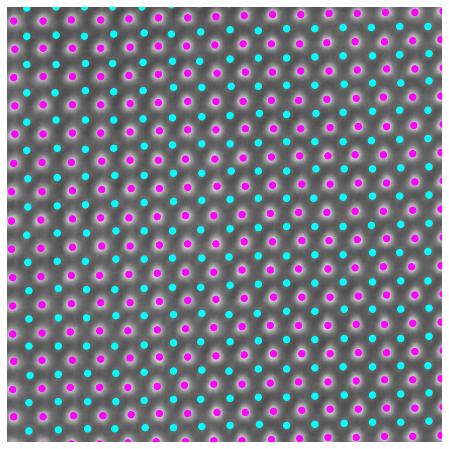

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.scatter(coms_target_c[:, 1], coms_target_c[:, 0], c=labels_c,  s=40, cmap='cool', marker= "o")


plt.xlim([400,800])
plt.ylim([400,800])
plt.axis('off')
plt.show()

### CrVAE data preparation

In [ ]:
# Data prepareation

subimages_target_reshaped = np.expand_dims(subimages_target, axis=-1)
train_data = torch.tensor(subimages_target_reshaped[:,:,:,0]).float()
lab_train = pv.utils.to_onehot(tt(labels_c).to(torch.int64), 2)
train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), lab_train, batch_size=48)

Testing the model

In [ ]:
in_dim = (w_prime[0],w_prime[1])

# Initialize vanilla VAE
crvae = pv.models.iVAE(in_dim, latent_dim=2, c_dim = 2,  # Number of latent dimensions other than the invariancies
                     hidden_dim_e = [512,512],   # corresponds to the number of neurons in the hidden layers of the encoder
                     hidden_dim_d = [512,512],# corresponds to the number of neurons in the hidden layers of the decoder
                       # corresponds to the number of neurons in the hidden layers of the decoder
                     invariances=["r"], seed=0)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(crvae)

# Train for n epochs:
for e in range(5):
    trainer.step(train_loader)
    trainer.print_statistics()

Epoch: 1 Training loss: 1934.6979
Epoch: 2 Training loss: 1900.8902
Epoch: 3 Training loss: 1898.0762
Epoch: 4 Training loss: 1870.5045
Epoch: 5 Training loss: 1851.5463


Latent manifold

In [ ]:
for cls in range(2):
    cls = pv.utils.to_onehot(tt([cls,]), 2)
    crvae.manifold2d(d=10, y=cls, cmap="gnuplot")

In [ ]:
# rvae_z_mean, rvae_z_sd = rvae.encode(train_data)
crvae_z_mean, crvae_z_sd = crvae.encode(train_data.unsqueeze(-1), lab_train)

ang = crvae_z_mean[:, 0]
z1 = crvae_z_mean[:, -2]
z2 = crvae_z_mean[:, -1]

print('no. of defects', crvae_z_mean.shape)

no. of defects torch.Size([10939, 3])


Latent Representatio

In [ ]:
plt.figure(figsize=(6, 6))

# Create the scatter plot with enhancements
sc = plt.scatter(crvae_z_mean[:, -2], crvae_z_mean[:, -1], c=labels_c, s=20, alpha=0.7,
                 edgecolors="k", cmap='jet')

plt.xlabel("z2", fontsize = 20)
plt.ylabel("ang", fontsize = 20)

# Remove ticks for a minimalist style
plt.xticks([])
plt.yticks([])
plt.show()

Results for this specific descriptor

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 8))  # Create a row of 3 subplots

# Plot for z1
axes[0].scatter(coms_target[:, 1], coms_target[:, 0], c=z1, s=10, cmap='jet', marker="s")
axes[0].axis("off")
axes[0].set_title("z1", fontsize=20)

# Plot for z2
axes[1].scatter(coms_target[:, 1], coms_target[:, 0], c=z2, s=10, cmap='jet', marker="s")
axes[1].axis("off")
axes[1].set_title("z2", fontsize=20)

# Plot for ang
axes[2].scatter(coms_target[:, 1], coms_target[:, 0], c=ang, s=10, cmap='jet', marker="s")
axes[2].axis("off")
axes[2].set_title("ang", fontsize=20)

# Show the plot
plt.tight_layout()
plt.show()

## OPTIMIZATION

Data Preparation

In [ ]:
def run_1(window_size, components):

            min_sigma = 1
            max_sigma = 5
            threshold = 0.025
            overlap = 0.0

            descriptors, coms_target, all_atoms, coordinates, subimages_target = build_descriptor(window_size, min_sigma, max_sigma, threshold, overlap)

            #normalize imagestack
            subimages_target_reshaped = np.expand_dims(subimages_target, axis=-1)
            train_data = torch.tensor(subimages_target_reshaped[:,:,:,0]).float()
            lab_train = pv.utils.to_onehot(tt(labels_c).to(torch.int64), 2)
            train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), lab_train, batch_size=48)
            in_dim = (window_size[0],window_size[1])

            # Initialize vanilla VAE
            crvae = pv.models.iVAE(in_dim, latent_dim=2, c_dim = 2,  # Number of latent dimensions other than the invariancies
                                 hidden_dim_e = [512,512],   # corresponds to the number of neurons in the hidden layers of the encoder
                                 hidden_dim_d = [512,512],# corresponds to the number of neurons in the hidden layers of the decoder
                                   # corresponds to the number of neurons in the hidden layers of the decoder
                                 invariances=["r"], seed=0)
            # Initialize SVI trainer
            trainer = pv.trainers.SVItrainer(crvae, seed=0)

            # Train for n epochs:
            for e in range(20):
                trainer.step(train_loader)
                trainer.print_statistics()


            z_mean, z_sd = crvae.encode(train_data.unsqueeze(-1), lab_train)

            z1 = z_mean[:, -2]
            z2 = z_mean[:, -1]
            ang = z_mean[:, 0]

            return z2, z1, ang, coms_target, descriptors

**Z processing**

As we have to convert the continuous labels obtained from CrVAE to discrete labels to define a better boundary detection between clusters

In [ ]:
def analyze_z2(z2):
    # Ensure z2 is a NumPy array
    z2 = z2.detach().cpu().numpy() if not isinstance(z2, np.ndarray) else z2

    # Perform Kernel Density Estimation (KDE) on z2
    kde = KernelDensity(bandwidth=0.1).fit(z2.reshape(-1, 1))
    z2_range = np.linspace(z2.min(), z2.max(), 1000)
    log_density = kde.score_samples(z2_range.reshape(-1, 1))

    # Convert log density to density
    density = np.exp(log_density)

    # Find peaks in the KDE
    peaks, properties = find_peaks(density, height=0.1)  # Identify peaks with height threshold of 0.1

    # Check if more than 5 peaks are found, and if so, select the top 5 peaks by height
    if len(peaks) > 5:
        peak_heights = properties['peak_heights']
        # Sort the peaks by height (descending order)
        sorted_peak_indices = np.argsort(peak_heights)[::-1]
        top_five_indices = sorted_peak_indices[:5]  # Get indices of the top 5 peaks
        peaks = peaks[top_five_indices]  # Update peaks to only include the top 5
        peak_heights = peak_heights[top_five_indices]  # Update peak heights to match the top 5
    else:
        peak_heights = properties['peak_heights']

    # Use the peak locations for classification, based on proximity to nearest peak
    peak_positions = z2_range[peaks]

    # Classify z2 values by assigning each to the nearest peak
    z2_classification = np.array([np.argmin(np.abs(peak_positions - z)) for z in z2])

    # Plot the KDE and peaks
    plt.figure(figsize=(8, 6))
    plt.plot(z2_range, density, color='blue', label='KDE of z2')
    plt.plot(z2_range[peaks], density[peaks], "x", label='Peaks', color='red', markersize=10)
    plt.xlabel('z2 Values')
    plt.ylabel('Density')
    plt.title('Kernel Density Estimation of z2 with Peaks')
    plt.legend(loc='upper right')
    plt.show()

    # Histogram of z2 with KDE overlaid
    plt.figure(figsize=(8, 6))
    counts, bins_hist, _ = plt.hist(z2, bins=100, color='green', edgecolor='black', alpha=0.6, label='Histogram of z2', density=True)
    plt.plot(z2_range, density, color='red', linewidth=2, label='KDE of z2')
    plt.plot(z2_range[peaks], density[peaks], "x", label='Peaks', color='blue', markersize=10)
    plt.xlabel('z2 Values')
    plt.ylabel('Density')
    plt.title('Histogram of z2 with KDE and Peaks')
    plt.legend(loc='upper right')
    plt.show()

    # Return classification and number of unique labels
    return z2_classification

Testing

In [ ]:
win = (48,56)
covariance_type = "full"
components = 5

z2, z1, ang, coms_target, descriptors = run_1(win, components)

In [ ]:
plt.figure(figsize=(6, 6))

# Create the scatter plot with enhancements
sc = plt.scatter(z2, z1, c=labels_c, s=20, alpha=0.7,
                 edgecolors="k", cmap='jet')

plt.xlabel("z1", fontsize = 20)
plt.ylabel("z2", fontsize = 20)

# Remove ticks for a minimalist style
plt.xticks([])
plt.yticks([])
plt.show()

Before converting labels to descrete labels

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 8))  # Create a row of 3 subplots

# Plot for z1
axes[0].scatter(coms_target[:, 1], coms_target[:, 0], c=z1, s=10, cmap='jet', marker="s")
axes[0].axis("off")
axes[0].set_title("z1", fontsize=20)

# Plot for z2
axes[1].scatter(coms_target[:, 1], coms_target[:, 0], c=z2, s=10, cmap='jet', marker="s")
axes[1].axis("off")
axes[1].set_title("z2", fontsize=20)

# Plot for ang
axes[2].scatter(coms_target[:, 1], coms_target[:, 0], c=ang, s=10, cmap='jet', marker="s")
axes[2].axis("off")
axes[2].set_title("ang", fontsize=20)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
z2_classification = analyze_z2(z2)

# Find unique labels
unique_labels = np.unique(z2_classification)
num_unique_labels = len(unique_labels)
num_unique_labels

After converting labels to descrete labels

In [ ]:
plt.figure(figsize=(8,  8))
plt.scatter(coms_target[:, 1], coms_target[:, 0], c=z2_classification, s=5, cmap='jet')
plt.axis("off")
plt.show()

### **Optimization block**

* **2** objetives
* **2** hayperparameters

1. descriptor_hight
2. descriptor_width

In [ ]:
class ImageOptimizationProblem(Problem):
    def __init__(self):
        super(ImageOptimizationProblem, self).__init__(3, 2)

        self.types[:] = [
            Real(8, 64),  # w_prime height
            Real(8, 64),  # w_prime width
            Real(0, 3)    # covariance type as a continuous variable
        ]
        self.directions[:] = [Problem.MINIMIZE, Problem.MAXIMIZE]

        # Initialize counter for saving process outputs
        self.run_counter = 0
        os.makedirs("process_outputs", exist_ok=True)

        # Open CSV file for writing results immediately
        self.results_file = open('solution_results.csv', mode='w', newline='')
        self.writer = csv.writer(self.results_file)
        self.writer.writerow(["Height_prime", "Width_prime", "Covariance Type", "Reward_1", "Reward_2"])
        self.results_file.flush()  # Ensure header is written immediately

    def evaluate(self, solution):
        def to_even_value(x):
            return int(np.round(x / 2) * 2)

        w_prime = (to_even_value(solution.variables[0]), to_even_value(solution.variables[1]))
        covariance_index = int(solution.variables[2])
        covariance_types = ['full', 'tied', 'diag', 'spherical']
        covariance_type = covariance_types[covariance_index % len(covariance_types)]

        # Run the evaluation function and retrieve relevant outputs
        z2, z1, ang, coms_target, descriptors = run_1(w_prime, components=5)
        labels = analyze_z2(z2)

        # Process the labels and segments
        edges_per_label = process_labels_and_plot(labels, coms_target)
        filtered_segments = filter_ordered_segments(edges_per_label)

        # Calculate curvature and length as objectives
        curvature = process_single_curvature(filtered_segments)
        length = calculate_reward_for_single_data(filtered_segments)

        # If any of the objectives are None, keep them as NaN
        curvature = curvature if curvature is not None else float('nan')
        length = length if length is not None else float('nan')

        # Set the solution objectives
        solution.objectives[:] = [curvature, length]

        # Save the results after each evaluation
        self.save_process_output(filtered_segments, w_prime, covariance_type, curvature, length)

    def save_process_output(self, filtered_segments, w_prime, covariance_type, curvature, length):
        run_dir = f"process_outputs/run_{self.run_counter}"
        os.makedirs(run_dir, exist_ok=True)

        # Save filtered segments to a .npy file
        np.save(os.path.join(run_dir, "filtered_segments.npy"), filtered_segments)

        # Save metadata to a text file
        with open(os.path.join(run_dir, "metadata.txt"), mode="w") as f:
            f.write(f"w_prime: {w_prime}, covariance_type: {covariance_type}")

        # Save individual solution results to CSV immediately, converting all values to strings
        self.writer.writerow([str(w_prime[0]), str(w_prime[1]), covariance_type, str(curvature), str(length)])
        self.results_file.flush()  # Ensure data is written to file immediately
        self.run_counter += 1

    def finalize(self):
        # Close the CSV file after all evaluations
        self.results_file.close()


# Example of running the evaluation with NSGA-II
problem = ImageOptimizationProblem()
algorithm = NSGAII(problem)
algorithm.run(10)  # Run the algorithm for 10 iterations

# Finalize to ensure the CSV file is properly closed
problem.finalize()

print("Results saved to 'solution_results.csv'.")

Results representation as pareto fronts

In [ ]:
# Given: solutions and objectives extraction from your algorithm's result
solutions_A = algorithm.result
objectives_A = [s.objectives[:] for s in solutions_A]

# Define your ideal point here
ideal_point = [0, 0]  # Replace ideal_obj1 and ideal_obj2 with your ideal values

# Normalize objectives between 0 and 1
obj_array = np.array(objectives_A)
obj_min = obj_array.min(axis=0)
obj_max = obj_array.max(axis=0)
normalized_objectives = (obj_array - obj_min) / (obj_max - obj_min)

# Calculate distances
euclidean_distances = [np.sqrt(np.sum((obj - ideal_point) ** 2)) for obj in normalized_objectives]
chebyshev_distances = [np.max(np.abs(obj - ideal_point)) for obj in normalized_objectives]

# Find the best solutions based on distances
best_solution_euclidean_index = np.argmin(euclidean_distances)
best_solution_chebyshev_index = np.argmin(chebyshev_distances)

# Separate normalized objectives for plotting
obj1 = normalized_objectives[:, 0]
obj2 = normalized_objectives[:, 1]


fig = plt.figure(figsize=(8, 8), dpi = 200)

# Create scatter plot of the Pareto front
plt.scatter(obj1, obj2, s=100, marker='o', c="blue", alpha=0.5)
plt.scatter(obj1[best_solution_euclidean_index], obj2[best_solution_euclidean_index], color='red', label='Best Euclidean' , alpha=1, marker='s', s = 160)
plt.scatter(obj1[best_solution_chebyshev_index], obj2[best_solution_chebyshev_index], color='green', label='Best Chebyshev', alpha=1, marker='s', s = 160)
# Create scatter plot

# Adding plot labels and title
# plt.title('Solutions Highlighted', fontsize = 16, fontweight = "bold")
plt.xlabel('R1', fontsize = 16, fontweight = "bold")
plt.ylabel('R2', fontsize = 16, fontweight = "bold")
plt.grid(True)
# plt.tick_params(axis='both', which='major', labelsize= 14)
# Keep the ticks but hide the tick labels
plt.tick_params(axis='both', which='both', labelbottom=False, labelleft=False)

# plt.xlim([-0.05, 1])  # Replace xmin and xmax with your desired values
# plt.ylim([-0.05, 1])
plt.legend(prop={'size': 14})
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

**Evaluation**

In [ ]:
image = selected_images[0]

height, width = image.shape
y_margin = int(height * 0.05)
x_margin = int(width * 0.05)

#Crop the image to get the central 90%
center_image = image[y_margin:height - y_margin, x_margin:width - x_margin]

win = (20,54) # write down the window_size defined by the model
covariance_type = "full"
components = 5

z2, z1, ang, coms_target, descriptors = run_1(win, components)

In [ ]:
z2_classification = analyze_z2(z2)
edges_per_label = process_labels_and_plot(z2_classification, coms_target)

In [ ]:
all_edge_coordinates = {}

# Loop over each label and corresponding edge mask
for label, edge_mask in edges_per_label:
    # Get the coordinates where the mask is True (indicating an edge)
    edge_coordinates = np.argwhere(edge_mask)
    # Store the coordinates in the dictionary
    all_edge_coordinates[label] = edge_coordinates

plt.imshow(center_image, cmap='gray')
plt.gca().invert_yaxis()

plt.scatter(all_edge_coordinates[0][:, 1], all_edge_coordinates[0][:, 0], marker = "o", s  = 1,  c ="r")
plt.scatter(all_edge_coordinates[1][:, 1], all_edge_coordinates[1][:, 0], marker = "o", s  = 1,  c ="g")
plt.scatter(all_edge_coordinates[2][:, 1], all_edge_coordinates[2][:, 0], marker = "o", s  = 1,  c ="b")
plt.scatter(all_edge_coordinates[3][:, 1], all_edge_coordinates[3][:, 0], marker = "o", s  = 1,  c ="y")
plt.scatter(all_edge_coordinates[4][:, 1], all_edge_coordinates[4][:, 0], marker = "o", s  = 1,  c ="c")


plt.axis("off")

In [ ]:
plt.figure(figsize=(8, 8), dpi = 200)

plt.scatter(coms_target[:, 1], coms_target[:, 0], c=z1,  s=10, cmap='jet', marker= "s")
plt.axis('off')
plt.show()

# Post Processing

This section is for analyzing data saved on ISSAC

Downloading data

In [ ]:
# ! gdown --id 1CYiOJHCEf4oscZFDkolHqPda1xZtdwGF

In [ ]:
# Load DataFrame
csv_file_path = '/content/solution_results_gmm.csv'
data = pd.read_csv(csv_file_path)

Normalizing the rewards

In [ ]:
scaler = MinMaxScaler()
data[['Reward_1_norm', 'Reward_2_norm']] = scaler.fit_transform(data[['Reward_1', 'Reward_2']])


# Display the dataframe
print(data.head(20))  # Checking the first few rows # Checking the first few rows
print(data.shape)

    Height_prime  Width_prime Covariance Type  Reward_1  Reward_2  \
0             28           18            full      0.09     23.21   
1             10           20            diag      0.03     16.58   
2             44           24            tied      0.10     23.23   
3             40           12            full      0.05     19.13   
4             42           20            diag      0.07     19.83   
5             38            8            tied      0.03     16.78   
6             14           18            tied      0.02     15.61   
7             42           14            diag      0.04     19.70   
8             50           56            tied      0.09     23.57   
9             20           58            tied      0.05     19.69   
10            62           54            tied      0.10     24.91   
11            30           46            tied      0.10     25.36   
12            56           10            tied      0.03     17.97   
13            52           32     

Here we can select to solution within pareto fronts

In [ ]:
df = pd.DataFrame(data)

# Create the initial scatter plot using Plotly
fig = go.Figure()

# Add data points to the scatter plot
fig.add_trace(go.Scatter(
    x=df['Reward_1_norm'],
    y=df['Reward_2_norm'],
    mode='markers',  # Only show markers, no text
    marker=dict(size=10, color='rgba(255, 102, 102, 0.8)', line=dict(width=2, color='DarkSlateGrey')),
    customdata=np.column_stack((df.index, df[['Height_prime', 'Width_prime', 'Covariance Type']].values)),  # Include index in customdata
    hovertemplate='<b>Index</b>: %{customdata[0]}<br>'  # Add index to hovertemplate
                  '<b>Reward_1</b>: %{x}<br>'
                  '<b>Reward_2</b>: %{y}<br>'
                  '<b>Height_prime</b>: %{customdata[1]}<br>'
                  '<b>Width_prime</b>: %{customdata[2]}<br>'
                  '<b>Covariance Type</b>: %{customdata[3]}<extra></extra>',
    name='Points'
))

# Add custom dashed zero lines as shapes (for x=0 and y=0)
fig.update_layout(
    shapes=[
        dict(type="line", x0=0, y0=df['Reward_2_norm'].min(), x1=0, y1=df['Reward_2_norm'].max(),
             line=dict(color="black", width=1, dash="dashdot")),  # X-axis zero line
        dict(type="line", x0=df['Reward_1_norm'].min(), y0=0, x1=df['Reward_1_norm'].max(), y1=0,
             line=dict(color="black", width=1, dash="dashdot"))   # Y-axis zero line
    ]
)

# Style the plot (white background, borders on all sides, thin grid lines, and square shape)
fig.update_layout(
    plot_bgcolor='white',  # Set background to white
    paper_bgcolor='white',  # Set the outer background to white
    showlegend=False,  # Disable legend
    autosize=False,  # Disable autosize for square shape
    width=700,  # Set width for square plot
    height=700,  # Set height for square plot
    xaxis=dict(
        showline=True,  # Add borders on all sides
        linewidth=2,
        linecolor='black',
        mirror=True,  # Add borders to the top
        showgrid=True,  # Show grid lines
        gridwidth=1,  # Make grid lines thinner
        gridcolor='lightgrey',
        ticks='',  # No ticks
        showticklabels=False  # Hide tick labels
    ),
    yaxis=dict(
        showline=True,  # Add borders on all sides
        linewidth=2,
        linecolor='black',
        mirror=True,  # Add borders to the right
        showgrid=True,  # Show grid lines
        gridwidth=1,  # Make grid lines thinner
        gridcolor='lightgrey',
        ticks='',  # No ticks
        showticklabels=False  # Hide tick labels
    )
)

# Display the initial plot
fig.show()

# Capture the selected points
selected_points = []

# Loop until two points are selected by the user
while len(selected_points) < 2:
    selected_index = int(input(f"Select a point index (0-{len(df)-1}): "))
    if selected_index in selected_points:
        print(f"Point {selected_index} is already selected, please choose another.")
    else:
        selected_points.append(selected_index)

# Plot with selected points highlighted (green and red squares)
fig_selected = go.Figure()

# Add the original points
fig_selected.add_trace(go.Scatter(
    x=df['Reward_1_norm'],
    y=df['Reward_2_norm'],
    mode='markers',  # Only show markers, no text
    marker=dict(size=40, color='rgba(255, 102, 102, 0.8)', line=dict(width=4, color='DarkSlateGrey')),
    customdata=df[['Height_prime', 'Width_prime', 'Covariance Type']],
    hovertemplate='<b>Reward_1</b>: %{x}<br><b>Reward_2</b>: %{y}<br><b>Height_prime</b>: %{customdata[0]}<br><b>Width_prime</b>: %{customdata[1]}<br><b>Covariance Type</b>: %{customdata[2]}<extra></extra>',
    name='Points'
))

# Highlight selected points with empty squares
# First selected point in green
idx_1 = selected_points[0]
fig_selected.add_trace(go.Scatter(
    x=[df['Reward_1_norm'][idx_1]],
    y=[df['Reward_2_norm'][idx_1]],
    mode='markers',
    marker=dict(size=80, symbol="square", color='rgba(0, 0, 0, 0)', line=dict(width=8, color='green')),  # Green empty square
    showlegend=False
))

# Second selected point in red
idx_2 = selected_points[1]
fig_selected.add_trace(go.Scatter(
    x=[df['Reward_1_norm'][idx_2]],
    y=[df['Reward_2_norm'][idx_2]],
    mode='markers',
    marker=dict(size=80, symbol="square", color='rgba(0, 0, 0, 0)', line=dict(width=8, color='red')),  # Red empty square
    showlegend=False
))

# Style the selected points plot (white background, borders on all sides, thin grid lines, and square shape)
fig_selected.update_layout(
    shapes=[
        dict(type="line", x0=0, y0=df['Reward_2_norm'].min(), x1=0, y1=df['Reward_2_norm'].max(),
             line=dict(color="black", width=2, dash="dashdot")),  # X-axis zero line
        dict(type="line", x0=df['Reward_1_norm'].min(), y0=0, x1=df['Reward_1_norm'].max(), y1=0,
             line=dict(color="black", width=2, dash="dashdot"))   # Y-axis zero line
    ],
    plot_bgcolor='white',  # Set background to white
    paper_bgcolor='white',  # Set the outer background to white
    showlegend=False,  # Disable legend
    autosize=False,  # Disable autosize for square shape
    width=1000,  # Set width for square plot
    height=1000,  # Set height for square plot
    xaxis=dict(
        showline=True,  # Add borders on all sides
        linewidth=4,
        linecolor='black',
        mirror=True,  # Add borders to the top
        showgrid=True,  # Show grid lines
        gridwidth=1,  # Make grid lines thinner
        gridcolor='lightgrey',
        ticks='',  # No ticks
        showticklabels=False  # Hide tick labels
    ),
    yaxis=dict(
        showline=True,  # Add borders on all sides
        linewidth=4,
        linecolor='black',
        mirror=True,  # Add borders to the right
        showgrid=True,  # Show grid lines
        gridwidth=1,  # Make grid lines thinner
        gridcolor='lightgrey',
        ticks='',  # No ticks
        showticklabels=False  # Hide tick labels
    )
)

# Show the new plot with the selected points highlighted
fig_selected.show()

# Display information for the selected points
print(f"Selected Point 1 (Index: {idx_1}) Info: Height_prime: {df['Height_prime'][idx_1]}, Width_prime: {df['Width_prime'][idx_1]}, Covariance Type: {df['Covariance Type'][idx_1]}")
print(f"Selected Point 2 (Index: {idx_2}) Info: Height_prime: {df['Height_prime'][idx_2]}, Width_prime: {df['Width_prime'][idx_2]}, Covariance Type: {df['Covariance Type'][idx_2]}")